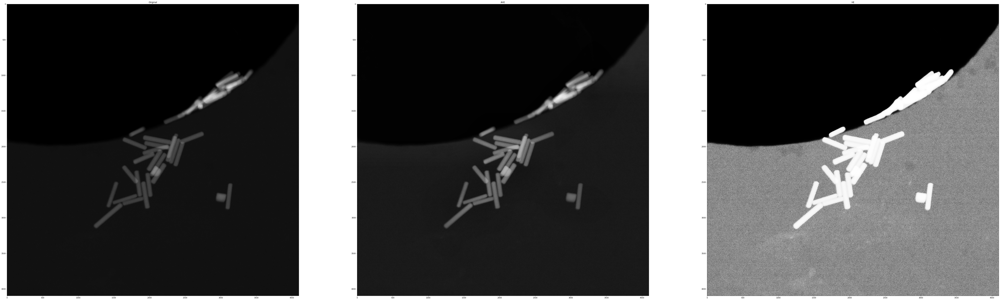

In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

img_file = '/Users/zhong2/Desktop/Data/QuesTek/20210517-NanoRods_compressed/20210517 0001 HAADF.tif'
# img_file = '/Users/zhong2/Desktop/Data/QuesTek/Vesicles/20190405-XenopusBx5-4D-Embryo-AnimalPole-TEMCircumferenceExport/20190405 2.0 kx Micro 1645 0001 Ceta.tif'
# img_file = '/Users/zhong2/Desktop/Data/QuesTek/Vesicles/20190408-Xenopus-Bx5-3D-Egg-AnimalPole-TEMCircum-Export/20190408 0007 Ceta.tif'


img = cv2.imread(img_file, 0)
img_he = cv2.equalizeHist(img)
img_ahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8)).apply(img)

# clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
# img_ahe = clahe.apply(img)

fig, axs = plt.subplots(1,3, figsize=(100,100))
# axs[0].imshow(img, cmap='gray', vmin=0, vmax=255)
axs[0].imshow(img, cmap='gray')
axs[0].title.set_text('Original')
axs[1].imshow(img_ahe, cmap='gray')
axs[1].title.set_text('AHE')
axs[2].imshow(img_he, cmap='gray')
axs[2].title.set_text('HE')




In [3]:
img_norm = (img - img.min()) / (img.max() - img.min()) * 255
img_norm = img_norm.astype(np.uint8)
img_norm_he = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8)).apply(img_norm)
img_norm_ahe = cv2.equalizeHist(img_norm)


# fig, axs = plt.subplots(1, 3, figsize=(50, 50))
# axs[0].imshow(img_norm, cmap='gray')
# axs[0].title.set_text('norm')
# axs[1].imshow(img_norm_he, cmap='gray')
# axs[1].title.set_text('norm_HE')
# axs[2].imshow(img_norm_ahe, cmap='gray')
# axs[2].title.set_text('norm_AHE')




### Save adjusted images

In [6]:
import random

def rescale_img(arr):
    new_arr = ((arr - arr.min()) * (1/(arr.max() - arr.min()) * 255)).astype('uint8')
    return new_arr


img_dir = '/Users/zhong2/Desktop/Data/QuesTek/Vesicles/20190405-XenopusBx5-4D-Embryo-AnimalPole-TEMCircumferenceExport/'
# img_dir = '/Users/zhong2/Desktop/Data/QuesTek/Vesicles/20190408-Xenopus-Bx5-3D-Egg-AnimalPole-TEMCircum-Export/'
# save_dir_norm = img_dir[:-1] + '_norm/'
save_dir_ahe = img_dir[:-1] + '_ahe/'

# if not os.path.exists(save_dir_norm):
#     os.makedirs(save_dir_norm)
if not os.path.exists(save_dir_ahe):
    os.makedirs(save_dir_ahe)

files = os.listdir(img_dir)
# file = random.choice(files)
for file in files:
    file_dir = img_dir + file

    img = cv2.imread(file_dir, 0)
#     plt.imshow(img, cmap='gray')
#     plt.axis('off')
#     plt.savefig(save_dir_norm + file[:-3] + 'eps', dpi=200, bbox_inches='tight', pad_inches=0)
    
    img_ahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8)).apply(img)
    img_ahe_rescale = rescale_img(img_ahe)
    img_rgb = cv2.cvtColor(img_ahe_rescale, cv2.COLOR_GRAY2RGB)
    cv2.imwrite(save_dir_ahe + file[:-3] + 'png', img_rgb)
#     plt.imshow(img_ahe, cmap='gray')
#     plt.axis('off')
#     plt.savefig(save_dir_ahe + file[:-3] + 'png', dpi=300, bbox_inches='tight', pad_inches=0)


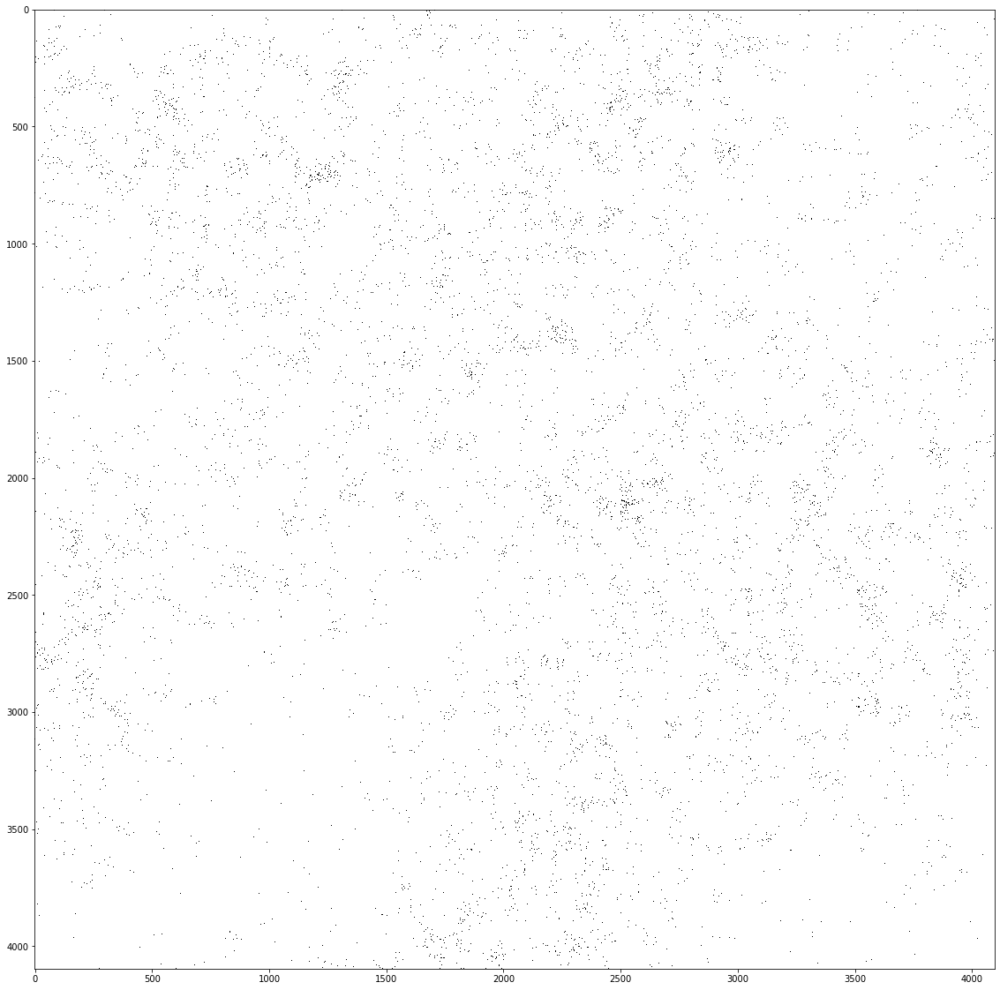

In [156]:
""" Direct Intensity Threshold"""
img = cv2.imread(img_file, 0)
min_val = img.min()

img[img>20] = 255
plt.figure(figsize = (20, 20))
plt.imshow(img, cmap = 'gray')

(Text(0.5, 1.0, 'Edge Image'),
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

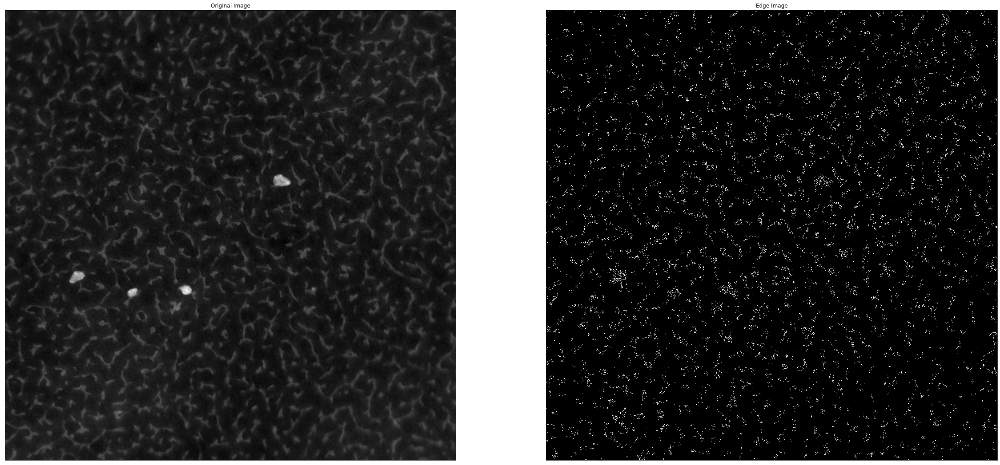

In [138]:
""" Edge Detection """

# img_file = '/Users/zhong2/Desktop/Data/QuesTek/20210517-NanoRods/20210517 0002 HAADF.tif'
img_file = '/Users/zhong2/Desktop/Data/QuesTek/20210515-IrregularNanoShapes/2021051525-115kx-Questek-RandomStructures HAADF.tif'
img = cv2.imread(img_file, 0)

img = cv2.GaussianBlur(img, ksize=(5,5), sigmaX=2)
# plt.figure(figsize = (10, 10))
# plt.imshow(img, cmap = 'gray')

edges = cv2.Canny(img, 0, 18, 3)
plt.figure(figsize = (40,20))
plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

Text(0.5, 1.0, 'Canny filter, $\\sigma=3$')

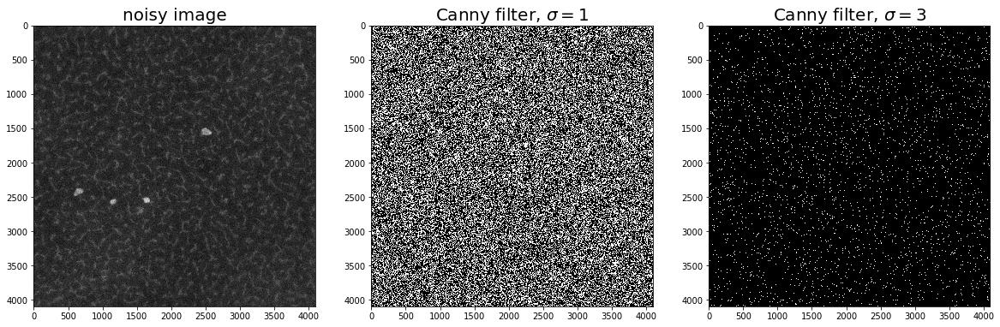

In [123]:
import skimage
import skimage.feature
import skimage.viewer


img_file = '/Users/zhong2/Desktop/Data/QuesTek/20210515-IrregularNanoShapes/2021051525-115kx-Questek-RandomStructures HAADF.tif'
img = skimage.io.imread(fname=img_file, as_gray=True)
# viewer = skimage.viewer(image=img)
# viewer.show()

# edges = feature.
edges1 = skimage.feature.canny(img, sigma=0, low_threshold=10, high_threshold=80)
edges2 = skimage.feature.canny(img, sigma=10, low_threshold=10, high_threshold=80)



fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 7))
ax[0].imshow(img, cmap='gray')
ax[0].set_title('noisy image', fontsize=20)

ax[1].imshow(edges1, cmap='gray')
ax[1].set_title(r'Canny filter, $\sigma=1$', fontsize=20)

ax[2].imshow(edges2, cmap='gray')
ax[2].set_title(r'Canny filter, $\sigma=3$', fontsize=20)

In [6]:
img_dir = '/Users/zhong2/Desktop/Data/QuesTek/20210517-NanoRods/'
save_dir = '/Users/zhong2/Desktop/Data/QuesTek/20210517-NanoRods_compressed_he/'


files = os.listdir(img_dir)
for file in files:
    if file[-9:] == 'HAADF.tif':
        img = cv2.imread(img_dir + file, 0)
#         plt.imshow(img, cmap='gray', vmin=0, vmax=255)
        img_ahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8)).apply(img)
        cv2.imwrite(save_dir + file, img_ahe)
